In [2]:
# importing necessary libraries
import pandas as pd
import numpy as np
import networkx as nx
import itertools
import random
from operator import itemgetter
import matplotlib.pyplot as plt
from heapq import nlargest, nsmallest
!pip install infomap
from infomap import Infomap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 263.1/263.1 kB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for infomap: filename=infomap-2.7.1-cp310-cp310-linux_x86_64.whl size=7690301 sha256=a055c7525d9df400ebbaf9ff660fa4864401430ca3b3b1e74a713611c560f884
  Stored in directory: /root/.cache/pip/wheels/e4/01/53/fd7c62079098140cd582b999592b4592c0dad7300cac32b6e1
Successfully built infomap


In [3]:
# reading list of edges
edges = pd.read_csv('connections.txt', delimiter=' ', names=['from', 'to'])
edges.head()

,from,to
0,0,1
1,0,2
2,0,3
3,0,4
4,0,5


1. Create a Directed graph

In [4]:
G = nx.from_pandas_edgelist(edges, 'from', 'to', create_using=nx.DiGraph())
print(G)

DiGraph with 4039 nodes and 88234 edges


2. Show which nodes are bridges.

Note: Below code prints the top 10 nodes with the highest betweenness centrality along with their betweenness centrality values, considering them as potential bridges in the directed graph. Please note that this is an approximation and not guaranteed to find all bridges, as bridge identification in directed graphs is a more complex problem.

In [5]:
betweenness = nx.betweenness_centrality(G)
bridges = nlargest(10, betweenness, key=betweenness.get)


for i in bridges:
    print(f'Potential bridge: Node {i} - Betweenness Centrality {betweenness[i]}')


Potential bridge: Node 1684 - Betweenness Centrality 0.03299985344063623
Potential bridge: Node 1912 - Betweenness Centrality 0.027145672353148857
Potential bridge: Node 1718 - Betweenness Centrality 0.026577614223444346
Potential bridge: Node 563 - Betweenness Centrality 0.01300961569074186
Potential bridge: Node 1405 - Betweenness Centrality 0.010123670299605515
Potential bridge: Node 1656 - Betweenness Centrality 0.009425937129610911
Potential bridge: Node 1086 - Betweenness Centrality 0.008553563518788857
Potential bridge: Node 567 - Betweenness Centrality 0.008300375906658487
Potential bridge: Node 3437 - Betweenness Centrality 0.008194350620311139
Potential bridge: Node 119 - Betweenness Centrality 0.006358997369476009


3. Show the density of the graph. Comment about your findings

In [6]:
density = nx.density(G)

print("Density:", density)

print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())


Density: 0.0054099817517196435
Number of nodes: 4039
Number of edges: 88234


4. Show which nodes have the highest and lowest number of connections.

In [7]:
# top 5
degrees = dict(G.degree())
highest_degrees = sorted(degrees.items(), key=lambda x: x[1], reverse=True)[:5]

for node, degree in highest_degrees:
    print(f'Node {node}: Degree {degree}')

Node 107: Degree 1045
Node 1684: Degree 792
Node 1912: Degree 755
Node 3437: Degree 547
Node 0: Degree 347


In [8]:
lowest_degrees = {node: degree for node, degree in degrees.items() if degree <= 2}
print("Nodes with the lowest connections", "\n",lowest_degrees)

Nodes with the lowest connections 
 {11: 1, 12: 1, 15: 1, 18: 1, 33: 2, 35: 2, 37: 1, 42: 2, 43: 1, 47: 2, 52: 2, 70: 2, 74: 1, 90: 2, 114: 1, 138: 2, 145: 2, 153: 2, 154: 2, 160: 2, 183: 2, 205: 2, 209: 1, 210: 1, 215: 1, 216: 2, 233: 2, 234: 2, 241: 2, 244: 2, 255: 2, 256: 2, 267: 2, 279: 2, 282: 2, 286: 2, 287: 1, 292: 1, 305: 2, 316: 2, 335: 1, 2814: 2, 911: 1, 918: 1, 1065: 2, 1096: 1, 1119: 1, 1145: 1, 1176: 2, 1206: 1, 1224: 2, 1233: 2, 1262: 2, 1270: 2, 1276: 2, 1326: 2, 1386: 1, 1394: 2, 1395: 2, 1430: 2, 1466: 1, 1558: 2, 1560: 1, 1581: 1, 1690: 2, 1755: 2, 1834: 1, 1854: 2, 2704: 2, 2740: 2, 358: 1, 377: 2, 379: 2, 401: 2, 443: 2, 447: 1, 468: 2, 550: 1, 581: 2, 585: 1, 602: 1, 607: 1, 608: 1, 613: 1, 624: 1, 638: 1, 642: 2, 648: 2, 668: 1, 674: 1, 1967: 2, 692: 1, 699: 2, 744: 2, 749: 2, 750: 2, 775: 2, 801: 1, 841: 2, 859: 2, 860: 2, 875: 1, 883: 1, 891: 1, 892: 1, 2788: 2, 2842: 1, 2857: 2, 3006: 2, 3031: 1, 3071: 1, 3125: 2, 3134: 2, 3183: 1, 3230: 1, 3268: 2, 3282: 2, 3

5. Show which nodes have the highest incoming and outgoing connections

In [9]:
# In-degree
in_degrees = dict(G.in_degree())
max_in_nodes = nlargest(5, in_degrees, key=in_degrees.get)
min_in_nodes = nsmallest(5, in_degrees, key=in_degrees.get)

# Out-degree
out_degrees = dict(G.out_degree())
max_out_nodes = nlargest(5, out_degrees, key=out_degrees.get)
min_out_nodes = nsmallest(5, out_degrees, key=out_degrees.get)

print("Nodes with the highest incoming connections (in-degree):", max_in_nodes)
#print("Nodes with the lowest incoming connections (in-degree):", min_in_nodes)
print("Nodes with the highest outgoing connections (out-degree):", max_out_nodes)
#print("Nodes with the lowest outgoing connections (out-degree):", min_out_nodes)


Nodes with the highest incoming connections (in-degree): [1888, 2543, 1800, 2611, 1827]
Nodes with the highest outgoing connections (out-degree): [107, 1684, 1912, 3437, 0]


6. Show which nodes have the highest closeness, betweenness, and eigenvector. Interpret your findings

In [10]:
closeness = nx.closeness_centrality(G)
betweenness = nx.betweenness_centrality(G)

eigenvector = nx.eigenvector_centrality(G, max_iter=500)

# nodes with the highest closeness centrality
max_closeness_nodes = nlargest(5, closeness, key=closeness.get)
print("Nodes with the highest closeness centrality:", max_closeness_nodes)

# nodes with the highest betweenness centrality
max_betweenness_nodes = nlargest(5, betweenness, key=betweenness.get)
print("Nodes with the highest betweenness centrality:", max_betweenness_nodes)

# nodes with the highest eigenvector centrality
max_eigenvector_nodes = nlargest(5, eigenvector, key=eigenvector.get)
print("Nodes with the highest eigenvector centrality:", max_eigenvector_nodes)


Nodes with the highest closeness centrality: [2642, 2649, 2629, 2643, 2543]
Nodes with the highest betweenness centrality: [1684, 1912, 1718, 563, 1405]
Nodes with the highest eigenvector centrality: [2655, 2654, 2646, 2638, 2631]


Comment:


**Closeness Centrality**:
- Nodes with the highest closeness centrality (e.g., 2642, 2649) are well-connected to other nodes in the network.
- These nodes can efficiently reach other nodes in the network in a relatively small number of steps.


**Betweenness Centrality**:
- Nodes with the highest betweenness centrality (e.g., 1684, 1912) act as important bridges or intermediaries in the network.
- These nodes play a crucial role in connecting different parts of the network.


**Eigenvector Centrality**:
- Nodes with the highest eigenvector centrality (e.g., 2655, 2654) have influence over other well-connected nodes.
- These nodes are considered influential based on the global structure of the network.

7. Implement a community detection algorithm on the directed graph and show how many
communities were created.

and

8. Show the largest and the smallest community. | Interpret your findings

In [11]:
def find_communities(G):
    im = Infomap("--two-level --directed")
    print("Building Infomap network from a NetworkX graph...")

    for e in G.edges():
        im.addLink(*e)

    im.run()
    print("Found {0} communities with codelength: {1}".format(im.num_top_modules,
                                                               im.codelength))
    communities = {}

    for node in im.tree:
        communities[node.node_id] = node.module_id

    nx.set_node_attributes(G, communities, 'community')

    # count the size of each community
    community_sizes = {community_id: sum(1 for node_id, comm_id in communities.items() if comm_id == community_id)
                       for community_id in set(communities.values())}

    # find the largest and smallest communities
    largest_community = max(community_sizes, key=community_sizes.get)
    smallest_community = min(community_sizes, key=community_sizes.get)

    print(f"Largest community (ID {largest_community}): {community_sizes[largest_community]} nodes")
    print(f"Smallest community (ID {smallest_community}): {community_sizes[smallest_community]} nodes")

    return im.num_top_modules

# call the function with your directed graph G
num_communities = find_communities(G)
print("Number of communities:", num_communities)

Building Infomap network from a NetworkX graph...
Found 93 communities with codelength: 6.596429348621003
Largest community (ID 4): 471 nodes
Smallest community (ID 61): 1 nodes
Number of communities: 93


Comment:

The network was analyzed using the Infomap community detection algorithm, resulting in the identification of 93 communities. The communities have varying sizes, with the largest community having 471 nodes (ID 4) and the smallest community having only 1 node (ID 61). The codelength, a measure of community structure, was found to be 6.596429348621003. This information suggests a diverse range of community sizes within the network.

9. Select the largest three communities and draw them. After doing so, remove the top 3
nodes with the highest Degree Centrality, Closeness Centrality, Betweenness Centrality,
and Eigenvector. Each should be in a separate plot/draw.

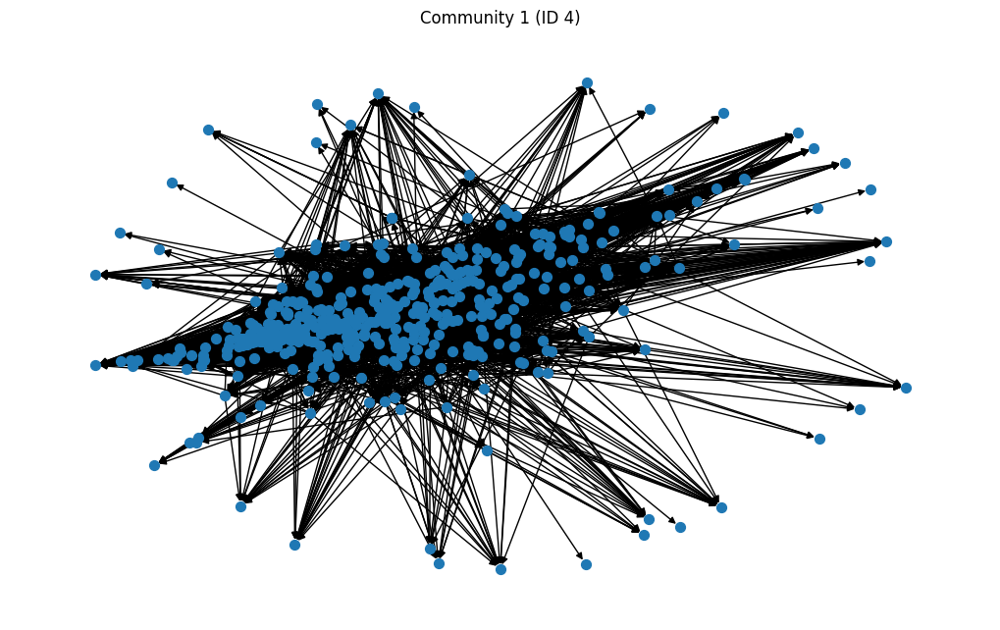

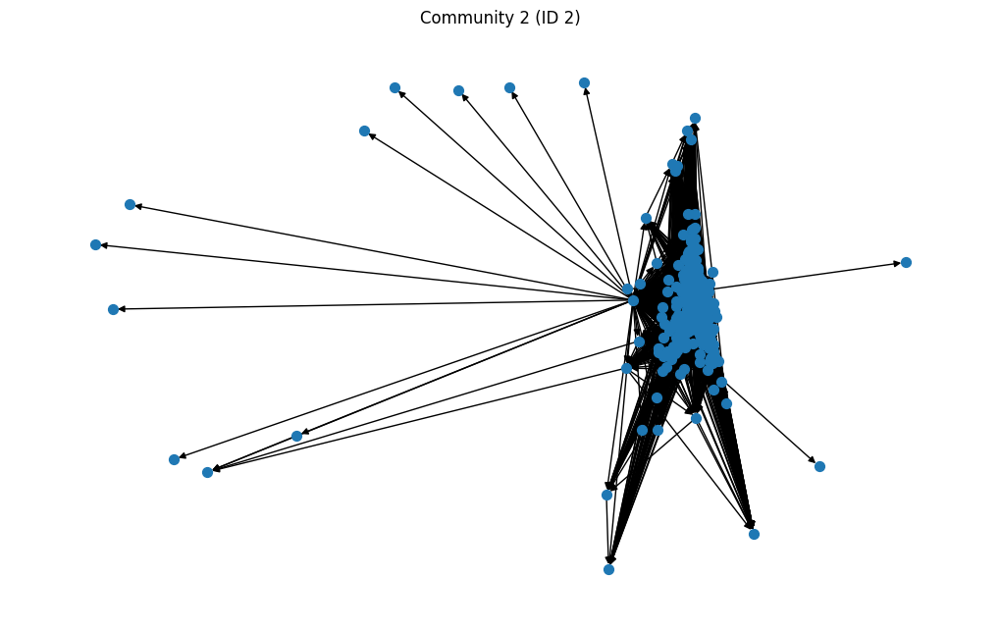

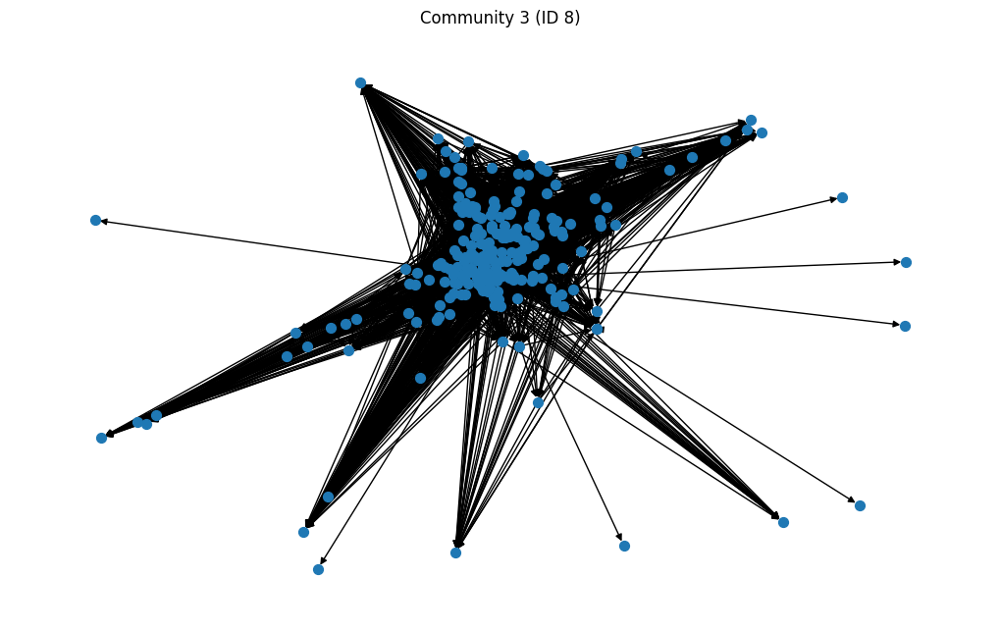

In [12]:
# get the community information from node attributes
communities = nx.get_node_attributes(G, 'community')

# count the size of each community
community_sizes = {community_id: sum(1 for node_id, comm_id in communities.items() if comm_id == community_id)
                   for community_id in set(communities.values())}

# identify the largest three communities
largest_communities = sorted(community_sizes.items(), key=lambda x: x[1], reverse=True)[:3]
largest_community_ids = [com_id for com_id, size in largest_communities]

# plot each community of the largest three separately
for i, community_id in enumerate(largest_community_ids, 1):
    subgraph = G.subgraph([node for node, comm_id in communities.items() if comm_id == community_id])

    plt.figure(figsize=(10, 6))
    pos = nx.spring_layout(subgraph)

    nx.draw(subgraph, pos, with_labels=False, node_size=50)
    plt.title(f"Community {i} (ID {community_id})")

    plt.show()


In [13]:
selected_data4 = dict((n,d['community']) for n,d in G.nodes().items() if d['community'] == 4)
selected_data2 = dict((n,d['community']) for n,d in G.nodes().items() if d['community'] == 2)
selected_data8 = dict((n,d['community']) for n,d in G.nodes().items() if d['community'] == 8)


sg4 = G.subgraph(list(selected_data4.keys()))
sg2 = G.subgraph(list(selected_data2.keys()))
sg8 = G.subgraph(list(selected_data8.keys()))

In [14]:
graphs = [sg4, sg2, sg8]

options = {
    "with_labels": False,
    "node_size": 100,
    "node_color": "#00A0DC",
    "edgecolors": "black",
    "linewidths": 0.7,
    "width": 0.35,
}

# another fucntion for plotting graphs as above
def plot_graphs(graphs):
    for g in graphs:
        plt.figure(figsize=(15, 15))
        nx.draw_networkx(g, **options)
    plt.show()

# plot_graphs(graphs)

In [15]:
# function for calculating top N degree closeness, betweenness, eigenvector centralities
def topN(graph, n, degree=False, close=False, between=False, eigen=False):
    if degree == True:
        word = "Degree"
        measures = nx.degree_centrality(graph)

    elif close == True:
        word = "Closeness"
        measures = nx.closeness_centrality(graph)

    elif between == True:
        word = "Betweenness"
        measures = nx.betweenness_centrality(graph)

    elif eigen == True:
        word = "Eigenvector"
        measures_in = nx.eigenvector_centrality(graph, max_iter=1000)
        measures_out = nx.eigenvector_centrality(graph.reverse(), max_iter=1000)

        measures = {}
        for key in measures_in.keys():
            measures[key] = (measures_in[key] + measures_out[key])/2

    top_nodes = nlargest(n, measures, key=measures.get)

    for i in top_nodes:
        print(f'Node {i}: {word} Centrality {measures[i]}')
    print("\n")
    return top_nodes

In [16]:
# top 3 degree centralities for 3 communities
sg4_deg = topN(sg4, 3, degree=True)
sg2_deg = topN(sg2, 3, degree=True)
sg8_deg = topN(sg8, 3, degree=True)

Node 1684: Degree Centrality 1.0
Node 3101: Degree Centrality 0.2574468085106383
Node 3291: Degree Centrality 0.2531914893617021


Node 107: Degree Centrality 1.0
Node 1800: Degree Centrality 0.6746268656716418
Node 1663: Degree Centrality 0.6656716417910448


Node 1912: Degree Centrality 0.9999999999999999
Node 2384: Degree Centrality 0.6793248945147679
Node 2111: Degree Centrality 0.6751054852320675




In [17]:
# top 3 closeness centralities for 3 communities
sg4_close = topN(sg4, 3, close=True)
sg2_close = topN(sg2, 3, close=True)
sg8_close = topN(sg8, 3, close=True)

Node 3434: Closeness Centrality 0.4607292666902512
Node 3397: Closeness Centrality 0.4540749853216652
Node 3406: Closeness Centrality 0.4282996645927747


Node 1800: Closeness Centrality 0.6836048763814516
Node 1827: Closeness Centrality 0.6522148980497968
Node 1833: Closeness Centrality 0.6475523061891446


Node 2511: Closeness Centrality 0.5945602077247646
Node 2510: Closeness Centrality 0.58362920654523
Node 2509: Closeness Centrality 0.583310186103726




In [18]:
# top 3 betweenness centralities for 3 communities
sg4_bet = topN(sg4, 3, between=True)
sg2_bet = topN(sg2, 3, between=True)
sg8_bet = topN(sg8, 3, between=True)

Node 1684: Betweenness Centrality 0.012949278790588954
Node 2951: Betweenness Centrality 0.01283533229766588
Node 3154: Betweenness Centrality 0.010338808235243963


Node 1352: Betweenness Centrality 0.008639508723370451
Node 1471: Betweenness Centrality 0.006831639175354458
Node 1431: Betweenness Centrality 0.0063869061049470705


Node 2289: Betweenness Centrality 0.015792389028967724
Node 2384: Betweenness Centrality 0.01336091089049189
Node 2133: Betweenness Centrality 0.012827556471580454




In [19]:
# top 3 eigenvector centralities for 3 communities
sg4_eig = topN(sg4, 3, eigen=True)
sg2_eig = topN(sg2, 3, eigen=True)
sg8_eig = topN(sg8, 3, eigen=True)

Node 3434: Eigenvector Centrality 0.4967925747184067
Node 990: Eigenvector Centrality 0.4942929941186158
Node 1450: Eigenvector Centrality 0.07476558021947567


Node 107: Eigenvector Centrality 0.49581638086477103
Node 1900: Eigenvector Centrality 0.49320046923944194
Node 1868: Eigenvector Centrality 0.081055293296832


Node 2519: Eigenvector Centrality 0.4962611364186576
Node 1465: Eigenvector Centrality 0.49520002154472564
Node 2518: Eigenvector Centrality 0.06042477406514103




In [20]:
color_deg_sg4 = ["red" if node in sg4_deg else "#00A0DC" for node in sg4.nodes]
color_deg_sg2 = ["red" if node in sg2_deg else "#00A0DC" for node in sg2.nodes]
color_deg_sg8 = ["red" if node in sg8_deg else "#00A0DC" for node in sg8.nodes]

In [21]:
color_close_sg4 = ["red" if node in sg4_close else "#00A0DC" for node in sg4.nodes]
color_close_sg2 = ["red" if node in sg2_close else "#00A0DC" for node in sg2.nodes]
color_close_sg8 = ["red" if node in sg8_close else "#00A0DC" for node in sg8.nodes]

In [22]:
color_bet_sg4 = ["red" if node in sg4_bet else "#00A0DC" for node in sg4.nodes]
color_bet_sg2 = ["red" if node in sg2_bet else "#00A0DC" for node in sg2.nodes]
color_bet_sg8 = ["red" if node in sg8_bet else "#00A0DC" for node in sg8.nodes]

In [23]:
color_eig_sg4 = ["red" if node in sg4_eig else "#00A0DC" for node in sg4.nodes]
color_eig_sg2 = ["red" if node in sg2_eig else "#00A0DC" for node in sg2.nodes]
color_eig_sg8 = ["red" if node in sg8_eig else "#00A0DC" for node in sg8.nodes]

In [24]:
# function for plotting graphs with their corresponding node colors
def plot_function(graph_list, color_list):

    for g, c in zip(graph_list, color_list):
        options = {
            "with_labels": False,
            "node_size": 100,
            "node_color": c,
            "edgecolors": "black",
            "linewidths": 0.7,
            "width": 0.35,
        }

        plt.figure(figsize=(15, 15))
        nx.draw_networkx(g, **options)
    plt.show()

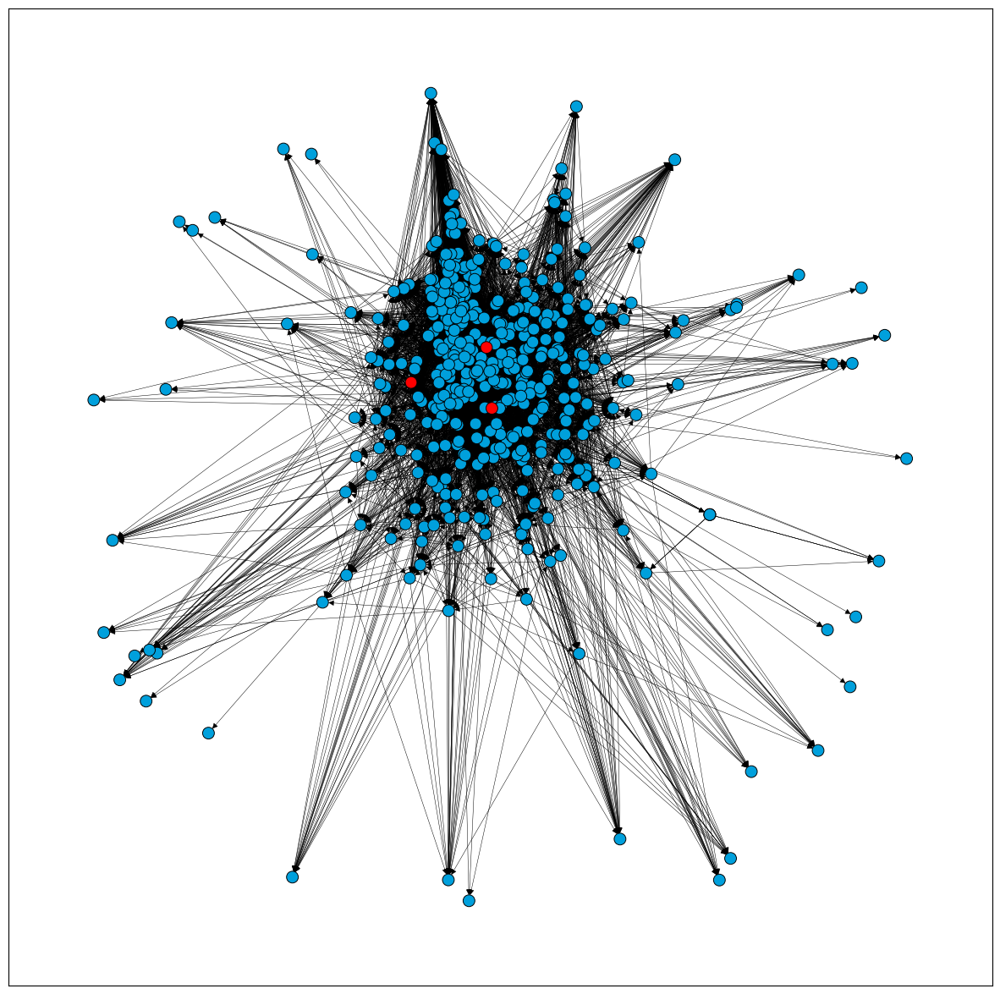

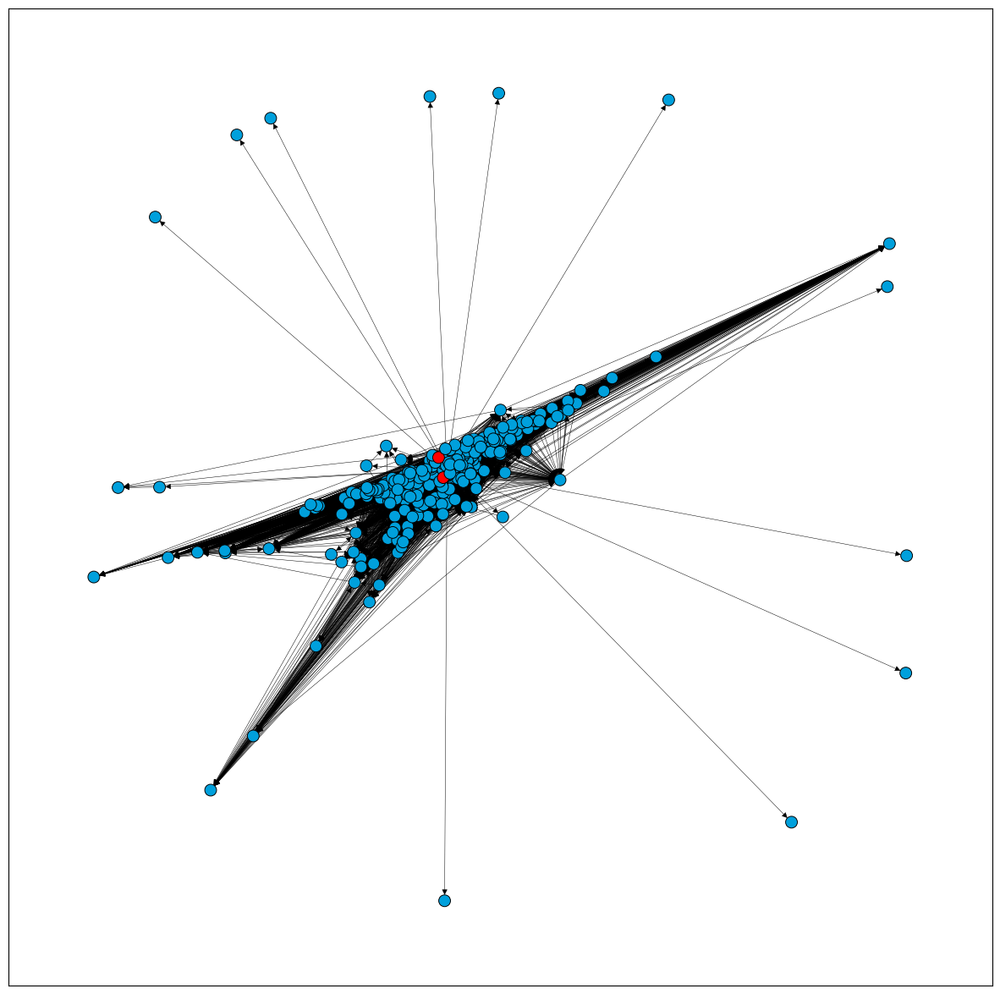

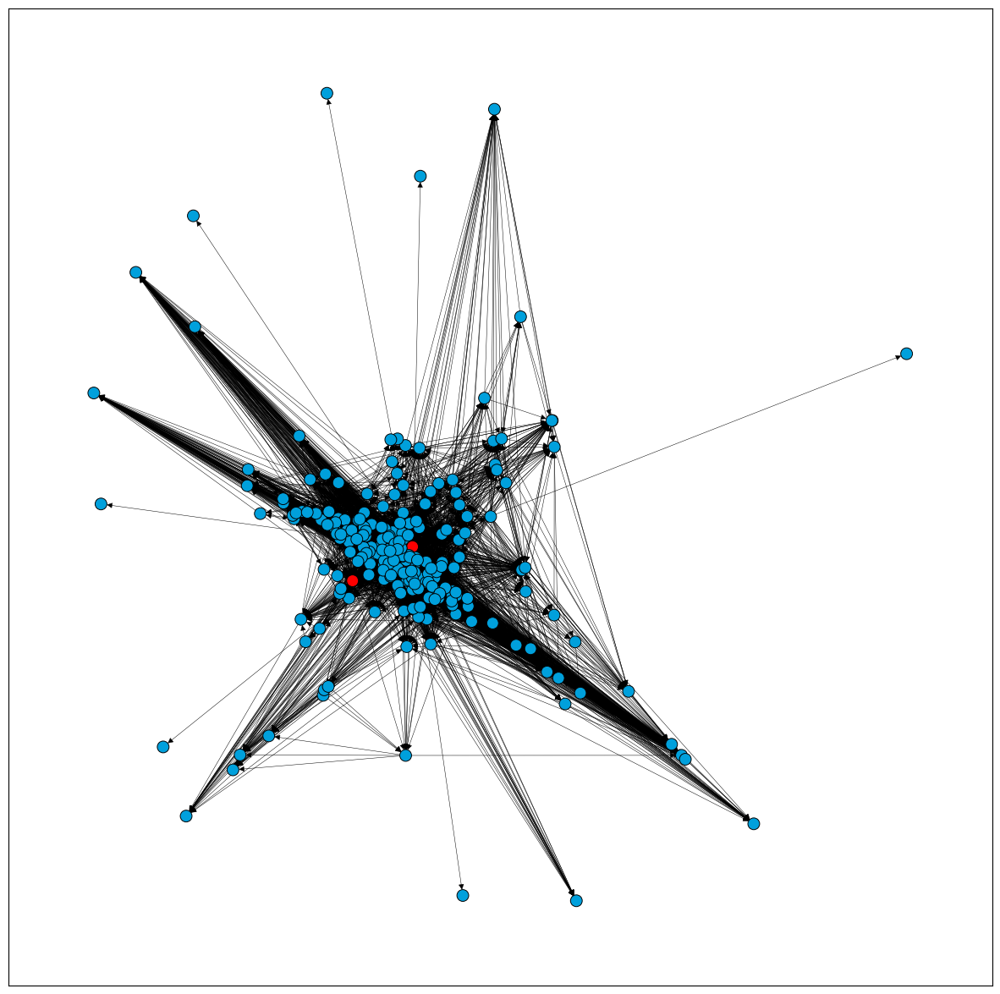

In [25]:
# ploting graphs for degree centralities
plot_function(graphs, [color_deg_sg4, color_deg_sg2, color_deg_sg8])

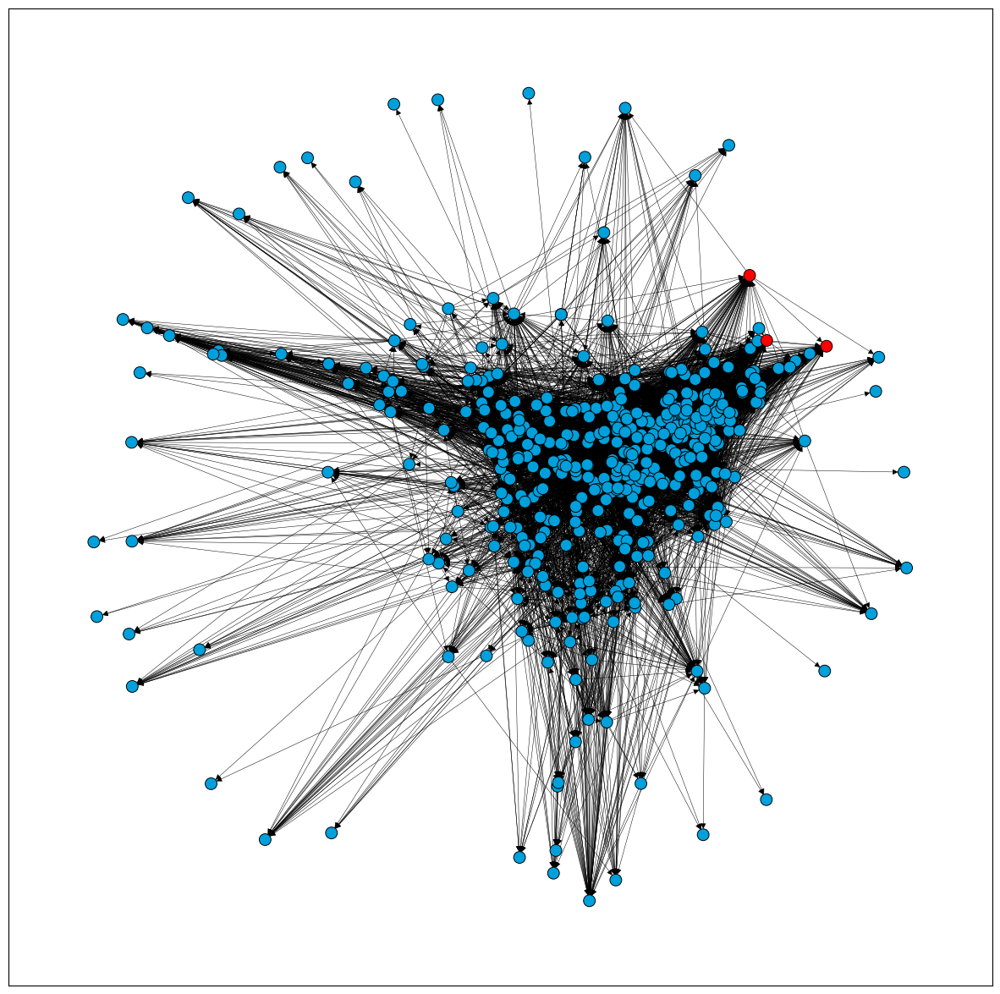

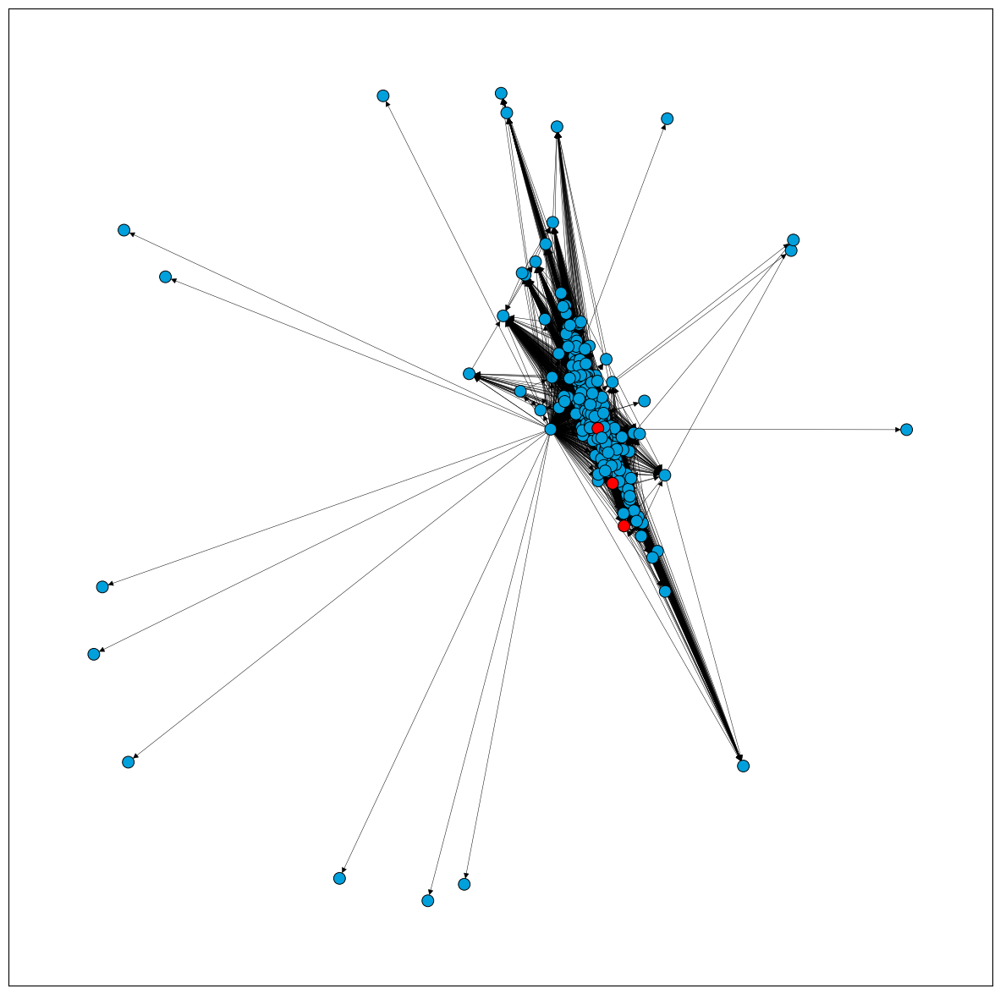

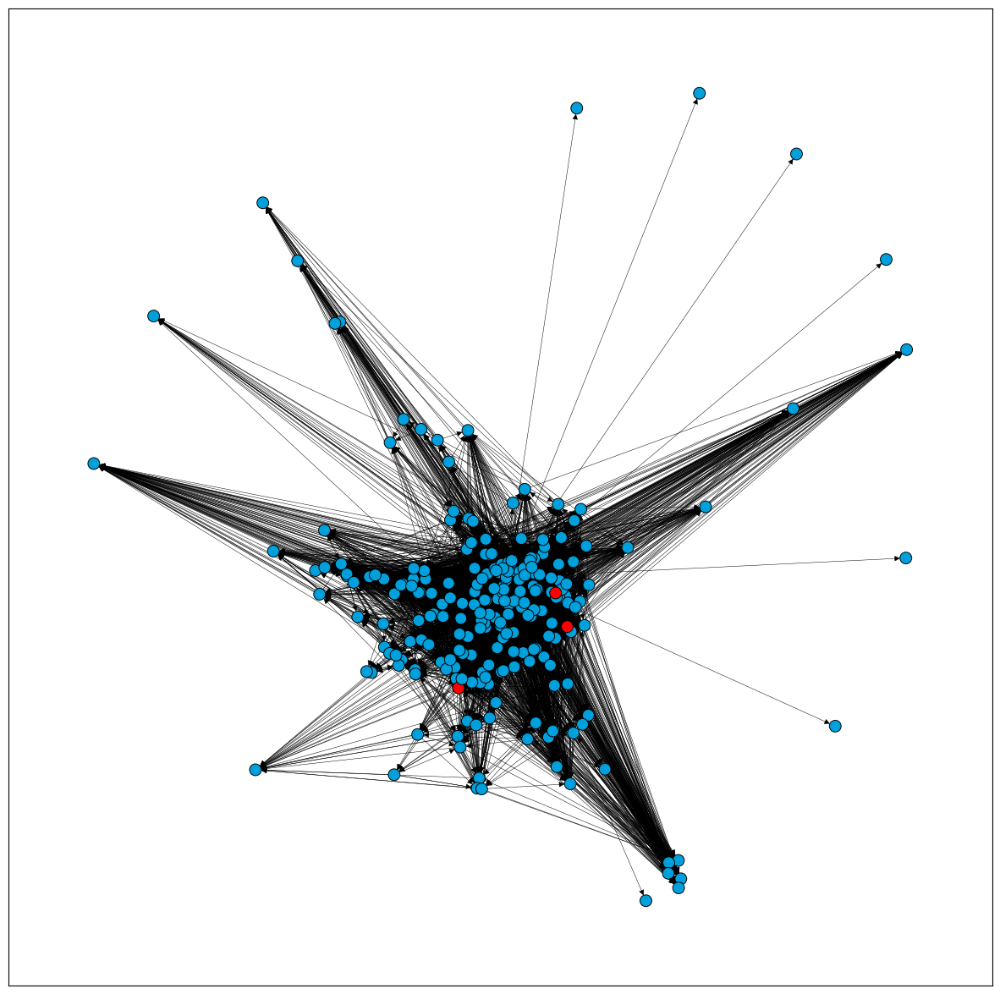

In [26]:
# ploting graphs for closeness centralities
plot_function(graphs, [color_close_sg4, color_close_sg2, color_close_sg8])

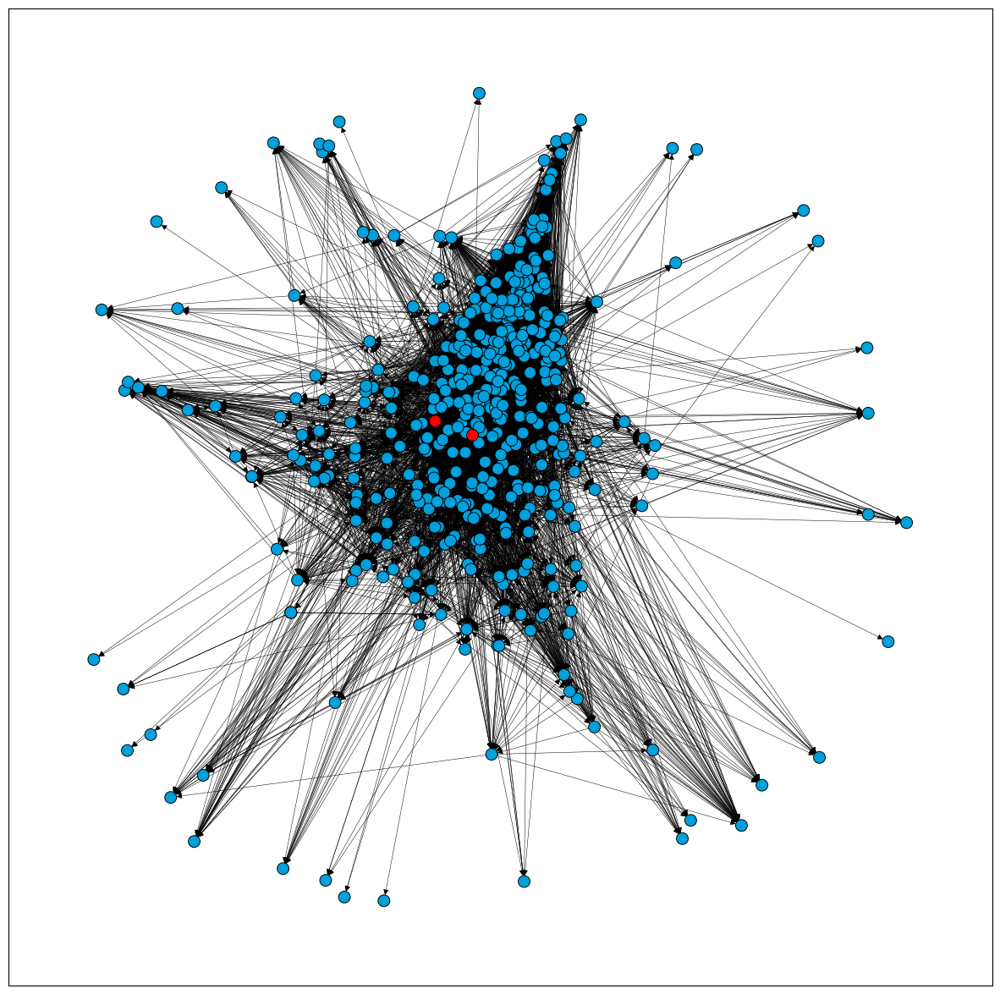

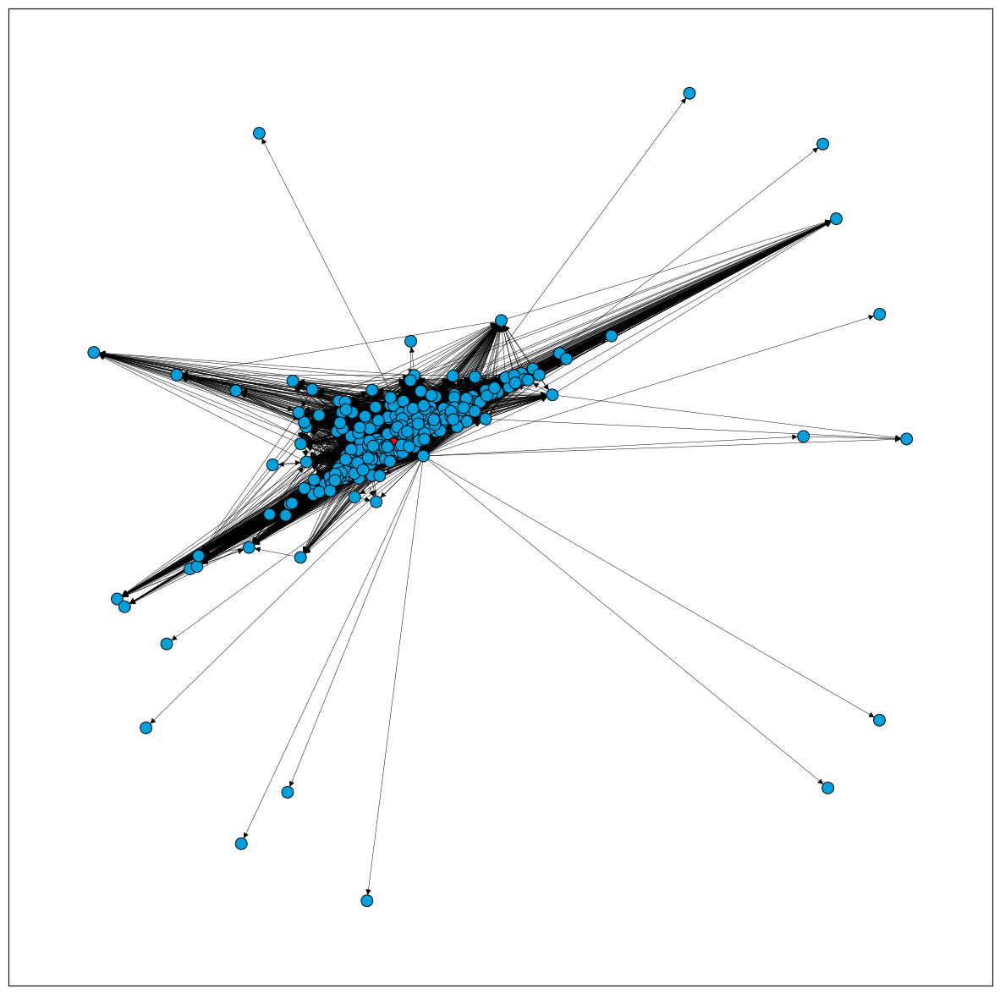

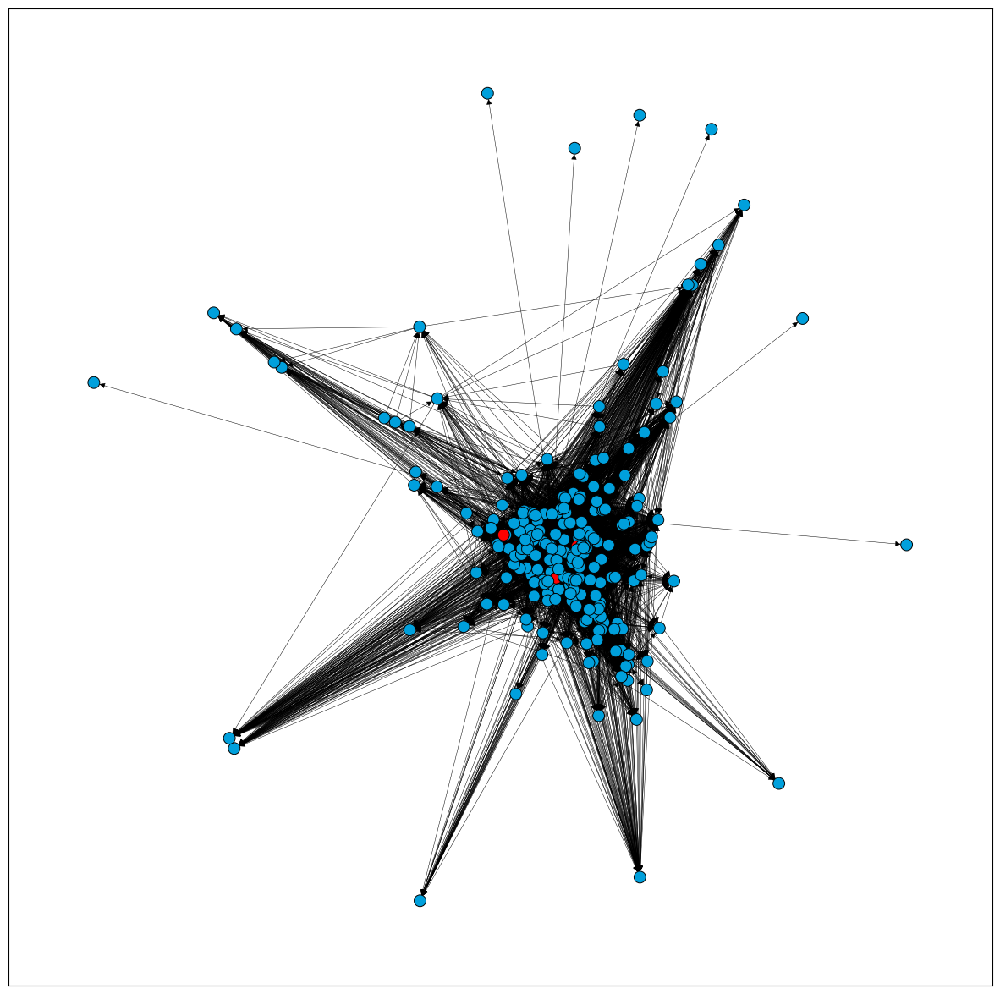

In [27]:
# ploting graphs for betweenness centralities
plot_function(graphs, [color_bet_sg4, color_bet_sg2, color_bet_sg8])

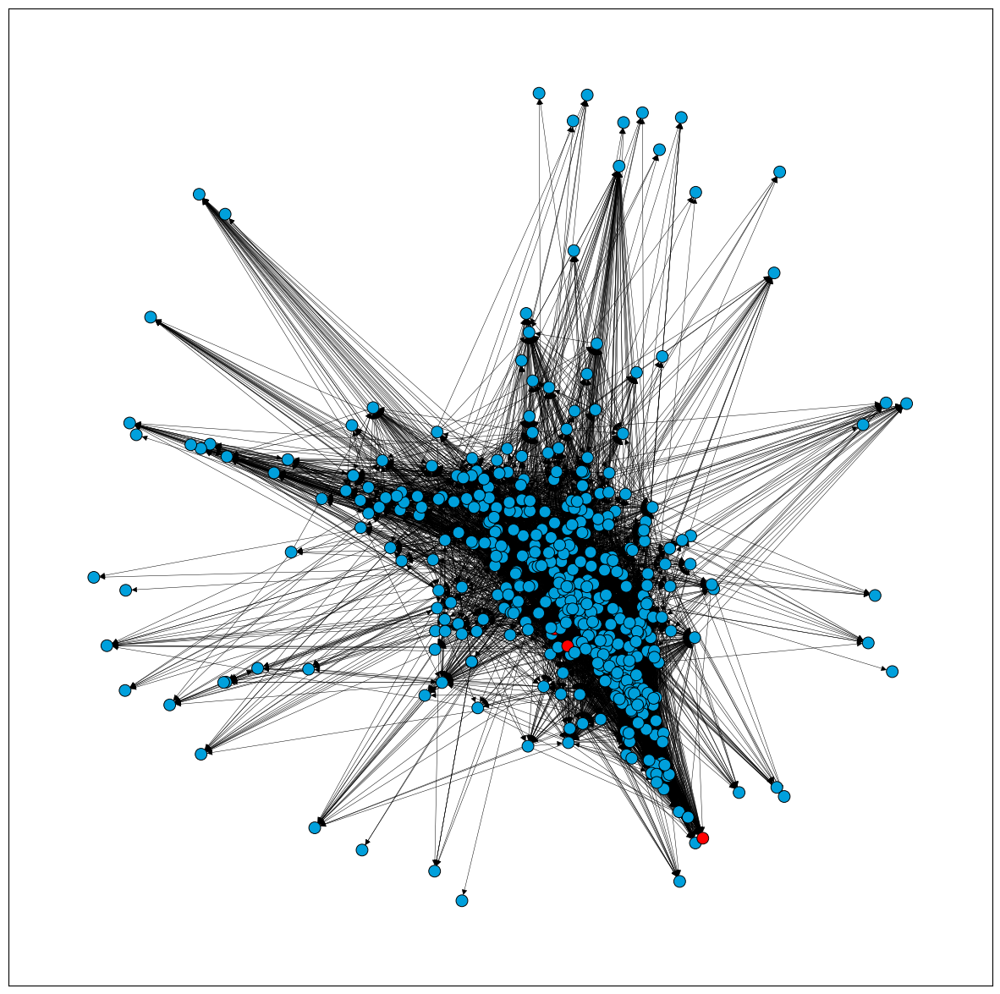

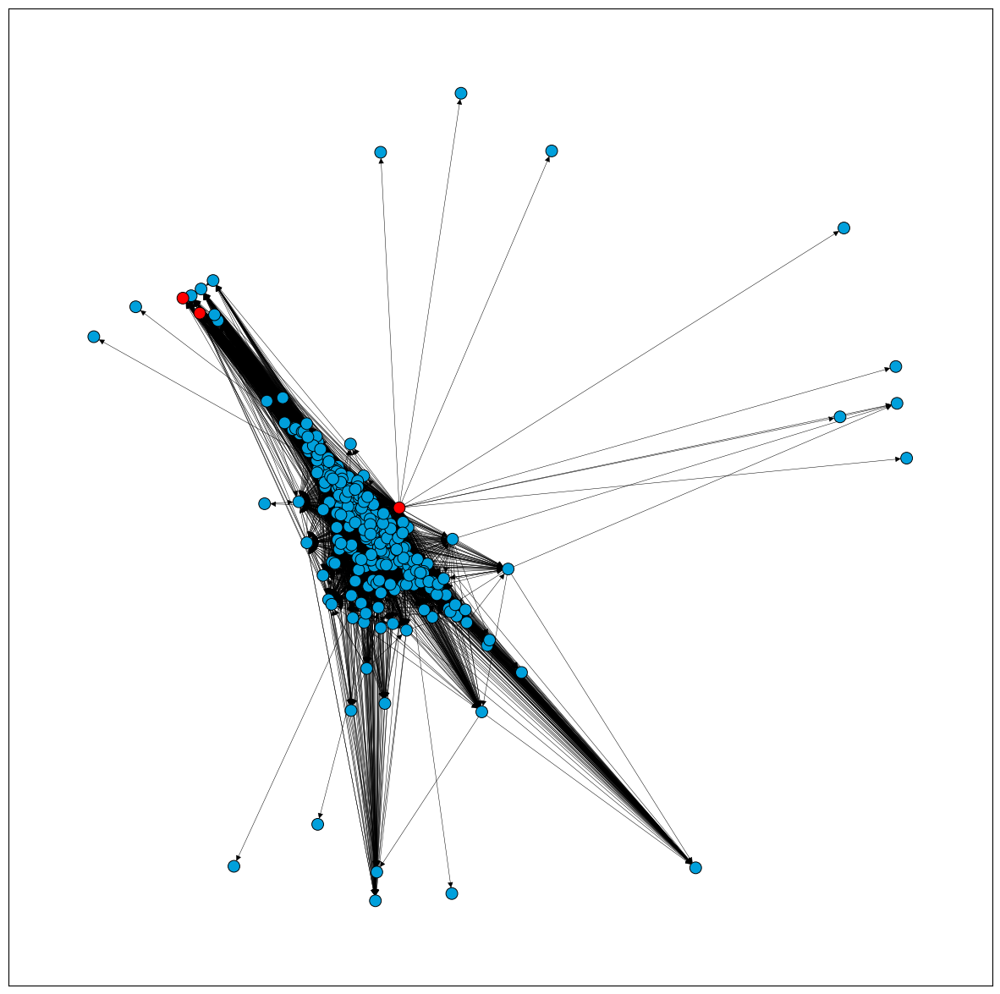

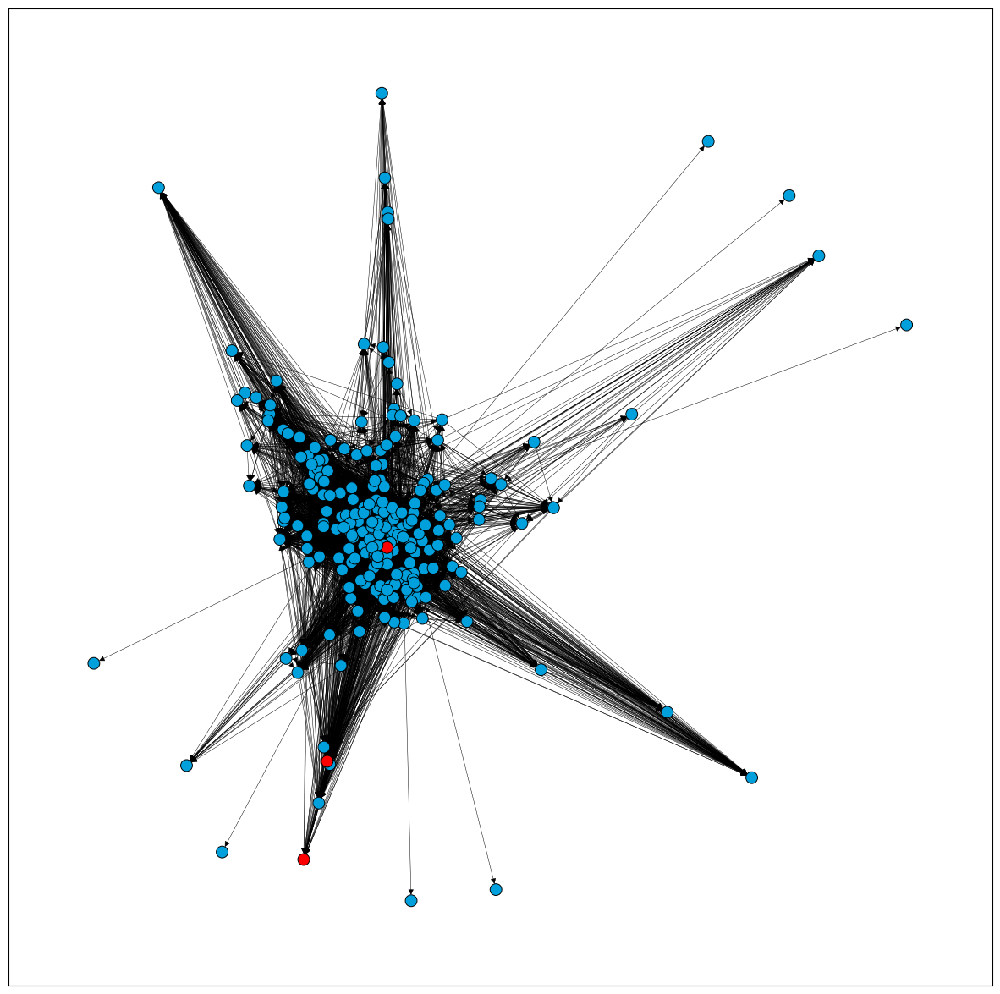

In [28]:
# ploting graphs for eigenvector centralities
plot_function(graphs, [color_eig_sg4, color_eig_sg2, color_eig_sg8])

10. Draw the influencers of those top 3 communities.

In [30]:
# influencers of top 3 communities in a list
infl_sg4 = list(set(sg4_close + sg4_bet))
infl_sg2 = list(set(sg2_close + sg2_bet))
infl_sg8 = list(set(sg8_close + sg8_bet))

# coloring influencers in red
color_infl_sg4 = ["red" if node in infl_sg4 else "#00A0DC" for node in sg4.nodes]
color_infl_sg2 = ["red" if node in infl_sg2 else "#00A0DC" for node in sg2.nodes]
color_infl_sg8 = ["red" if node in infl_sg8 else "#00A0DC" for node in sg8.nodes]

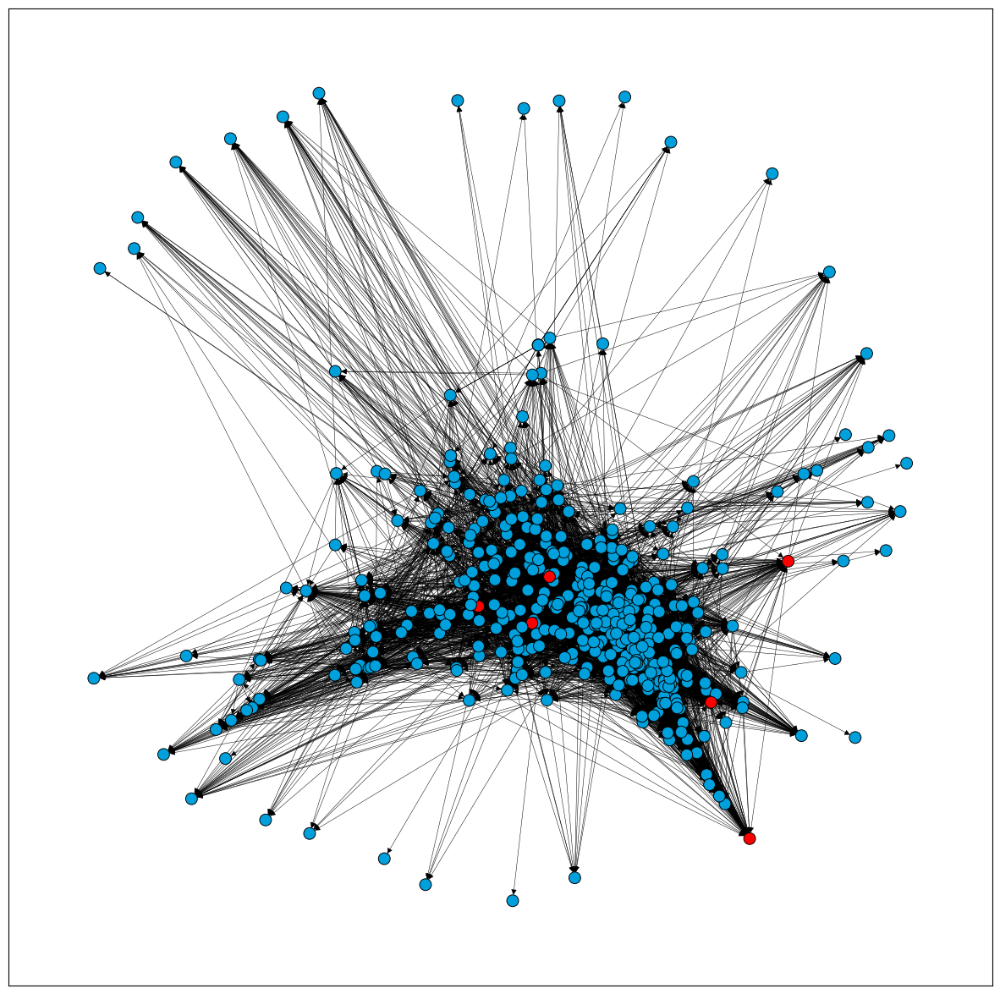

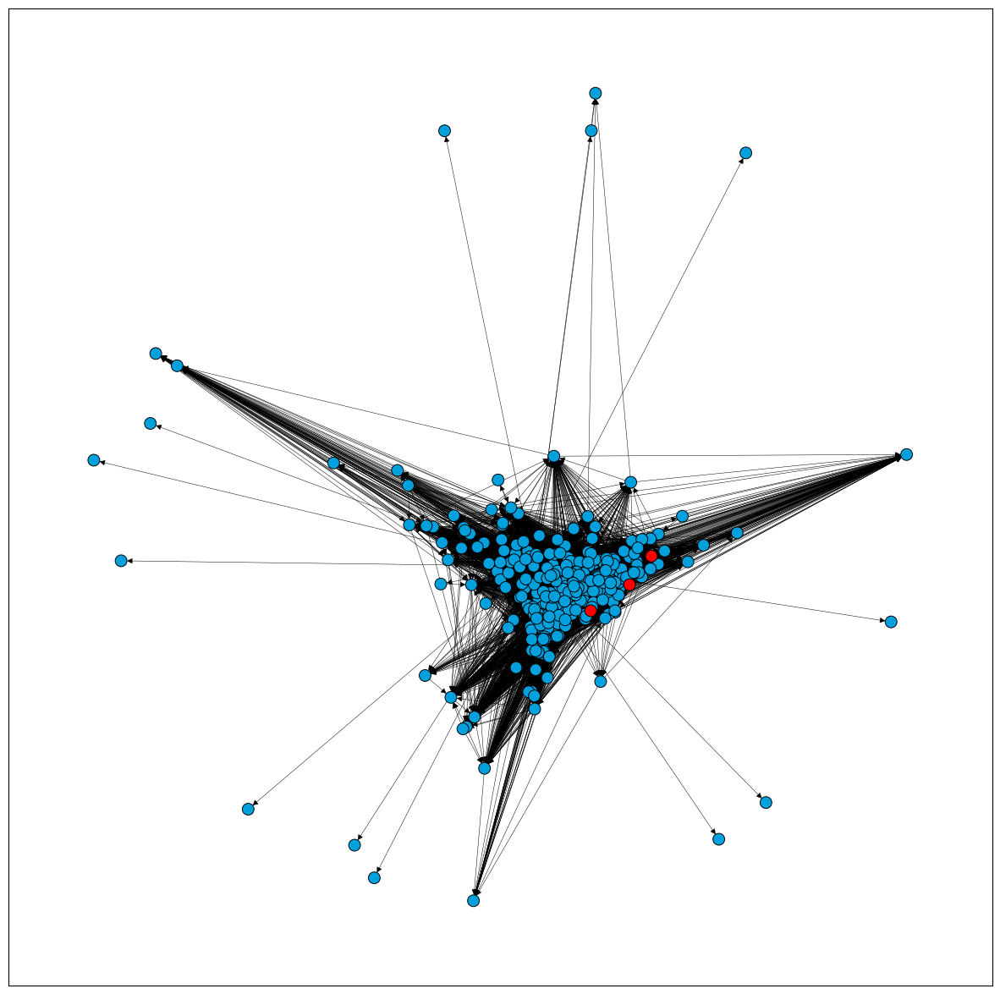

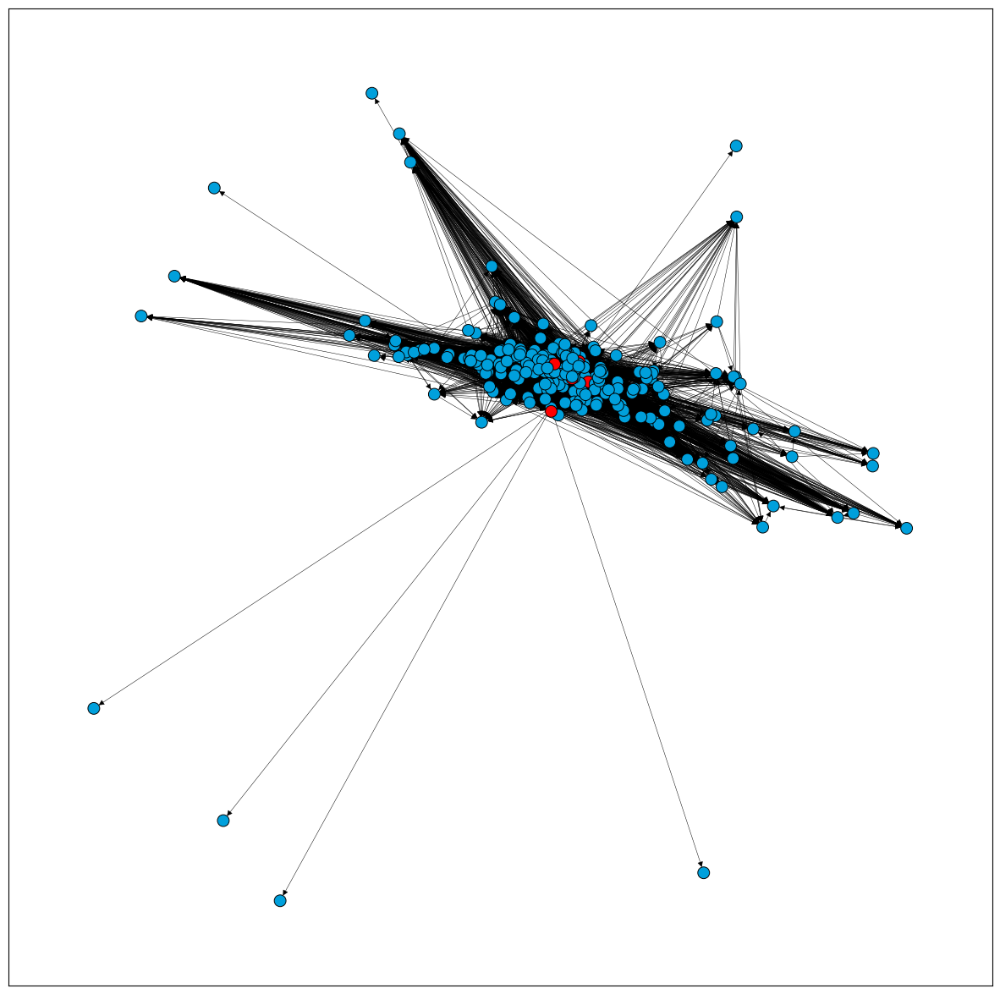

In [31]:
# plotting graphs with influencers
plot_function(graphs, [color_infl_sg4, color_infl_sg2, color_infl_sg8])

11. Design an action plan:

Hypothetical Business: Marketing Agency

Hypothetical Marketing Budget: $100,000

Hypothetical Cost Per Action (Advertisement Cost): $2 per click

Target Audience:

Demographic Targeting: Young professionals aged 25-34, residing in urban areas.
Interest-Based Targeting: Individuals interested in marketing, advertising, and business development.
Platform-Based Targeting: Focus on social media platforms like Instagram, LinkedIn, and Twitter.
Action Plan:

Market Research:
Conduct in-depth market research to understand the preferences and behaviors of the target audience.
Identify key competitors and analyze their marketing strategies.
Content Development:
Create engaging and informative content tailored to the interests of the target audience.
Develop visually appealing graphics and videos to enhance engagement.
Platform Selection:
Allocate a portion of the budget to advertising on social media platforms based on the target audience's presence.
Campaign Launch:
Launch a comprehensive online marketing campaign, including paid advertisements, sponsored content, and targeted posts.
Monitor the performance of different creatives and adjust the strategy based on real-time analytics.
Influencer Collaboration:
Collaborate with influencers in the marketing and business niche to amplify the campaign's reach.
Leverage influencers' credibility to enhance brand trust.
Email Marketing:
Implement an email marketing campaign to nurture leads and keep the audience engaged.
Provide exclusive offers and content to email subscribers.
Performance Tracking:
Utilize analytics tools to track the performance of the campaign.
Measure key performance indicators (KPIs) such as click-through rates, conversion rates, and return on investment (ROI).
Optimization:
Regularly optimize the campaign based on the performance data.
Allocate budget to the most successful channels and adjust targeting parameters.
Community Engagement:
Foster community engagement through social media discussions, polls, and user-generated content.
Encourage audience participation to build a sense of community.
Feedback and Analysis:
Collect feedback from the target audience through surveys or social media interactions.
Analyze the overall success of the campaign and identify areas for improvement.
Remember, this is a hypothetical scenario, and the specifics can be adjusted based on the nature of the business and industry trends.